# Contents:

- Importing Modules
- Initializing Dask
- Defining Keywords
- Dask Implementation: One Keyword (for visualization)
- Dask Implementation: All Keywords
- Creating CSV from Collected Links
- Extracting Text
- Daask Implementation: Extracting text from 10 links (for visualization)
- Dask Implementation: Extracting text from all links
- Exploratory Analysis: Mapping
- Exploratory Analysis: WordCloud (with Dask Implementation and visualization)
- Topic Modeling with inbuilt visualization: https://lsc-project-ram.000webhostapp.com/#topic=0&lambda=1&term= (I created a free account on a hosting website in order to host this html)

# Importing Modules

The scraping_functions, get_information and misc_helper functions are modules that I created. These include (in order) my crawler functions, functions to extract features from a link and miscellaneous helper functions (I have added docstrings for these). These **do not** include any functions that I came across on StackOverflow, Medium, TowardsDataScience -- such functions have been added in this Jupyter Notebook.

In [1]:
%load_ext autoreload
%autoreload 2
import pandas as pd
import dask.dataframe as dd
from dask.distributed import Client, LocalCluster
from scraping_functions import crawl_dawn, crawl_news, cleanhtml
from get_information import extract_article_info, dict_to_df
from misc_helper_functions import flatten, remove_dup
import matplotlib.pyplot as plt
import seaborn as sns
import fiona
import geopandas as gpd
import numpy as np
import re
from sklearn.decomposition import LatentDirichletAllocation as LDA
from sklearn.feature_extraction.text import CountVectorizer
import dask
import dask.array as da
from sklearn.model_selection import GridSearchCV
from matplotlib import style
style.use('seaborn-poster')
from datetime import datetime
import nltk
from collections import Counter
from wordcloud import WordCloud, STOPWORDS 
from nltk.corpus import stopwords
import warnings

%matplotlib inline
warnings.simplefilter("ignore")
 

# Initializing Dask

I use 4 clusters on my local computer.

In [3]:
cluster = LocalCluster()
cluster.scale(4)

In [4]:
cluster.workers.items()

dict_items([(0, <Nanny: tcp://127.0.0.1:59588, threads: 2>), (1, <Nanny: tcp://127.0.0.1:59589, threads: 2>), (2, <Nanny: tcp://127.0.0.1:59590, threads: 2>), (3, <Nanny: tcp://127.0.0.1:59587, threads: 2>)])

In [5]:
for x in cluster.workers:
    print(cluster.workers[x].status)

Status.running
Status.running
Status.running
Status.running


# Defining Keywords

In [6]:
keywords = ["rape", "gang-rape", "gender-based violence", "honour killing", 
            "honor killing", "harrassment", "blackmail","child abuse", 
            "forced marriage", "forced abortion", "women killed over honor", 
            "girl", "boy", "allegedly", "police"]

one_keyword = ['honor killing']

# Dask Implementation: One Keyword

This is just for the purpose of showing the Task graph

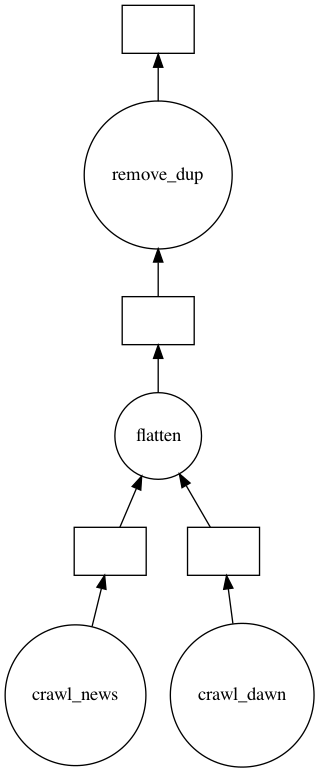

In [7]:
from dask.delayed import delayed
import dask
results = []

for word in one_keyword:
    dawn = dask.delayed(crawl_dawn)(word)
    news = dask.delayed(crawl_news)(word)
    results.append(dawn)
    results.append(news)

flatten_delayed = dask.delayed(flatten)(results)
unique_delayed = dask.delayed(remove_dup)(flatten_delayed)
unique_delayed.visualize("dask1")

# Dask Implementation: All Keywords

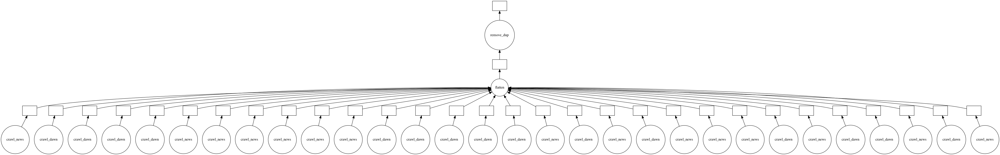

In [8]:
from dask.delayed import delayed
import dask
results = []

for word in keywords:
    dawn = dask.delayed(crawl_dawn)(word)
    news = dask.delayed(crawl_news)(word)
    results.append(dawn)
    results.append(news)

flatten_delayed = dask.delayed(flatten)(results)
unique_delayed = dask.delayed(remove_dup)(flatten_delayed)
unique_delayed.visualize()

In [9]:
combined_results = unique_delayed.compute()

The News: Error in Scraping
The News: Error in Scraping
The News: Error in Scraping
The News: Error in Scraping
The News: Error in Scraping


The print statements above indicate there was an error in Scraping -- this happens because the crawler ran out of pages to scrape -- this was not an issue in our data


The results below are from the implementation of our delayed crawler functions.

In [11]:
combined_results

{'https://www.dawn.com/news/1447790/teenage-girl-kidnapped-allegedly-raped-in-karachis-mehmoodabad',
 'https://www.thenews.com.pk/latest/712364-indian-actress-kondapalli-sravani-allegedly-commits-suicide',
 'https://www.thenews.com.pk/print/626956-governor-takes-notice-of-chinese-student-s-alleged-harassment',
 'https://www.thenews.com.pk/print/715032-cabinet-condemns-motorway-rape-incident',
 'https://www.dawn.com/news/1571280',
 'https://www.dawn.com/news/1579757/decomposed-body-of-minor-boy-found-in-tank',
 'https://www.thenews.com.pk/print/671265-teenage-girl-killed',
 'https://www.dawn.com/news/1541283',
 'https://www.dawn.com/news/1345304',
 'https://www.thenews.com.pk/tns/detail/596493-not-an-isolated-event',
 'https://www.dawn.com/news/1584059',
 'https://www.dawn.com/news/1474960',
 'https://www.dawn.com/news/1578807',
 'https://www.dawn.com/news/1579592',
 'https://www.dawn.com/news/1367292',
 'https://www.thenews.com.pk/print/162562-Young-man-acquitted-of-forced-marriage-cha

# Creating csv from results

Here, I create a csv with all the links that we have crawled.

In [12]:
df = pd.DataFrame(combined_results)
df.rename(columns={df.columns[0]: "link"}, inplace=True)
df.to_csv("all_links.csv")

# Extracting Text (from each link)

In [21]:
combined_result_short = list(combined_results)[1:10]

# Dask Visualization: 10 links

This is for the purpose of showing the dask visualization

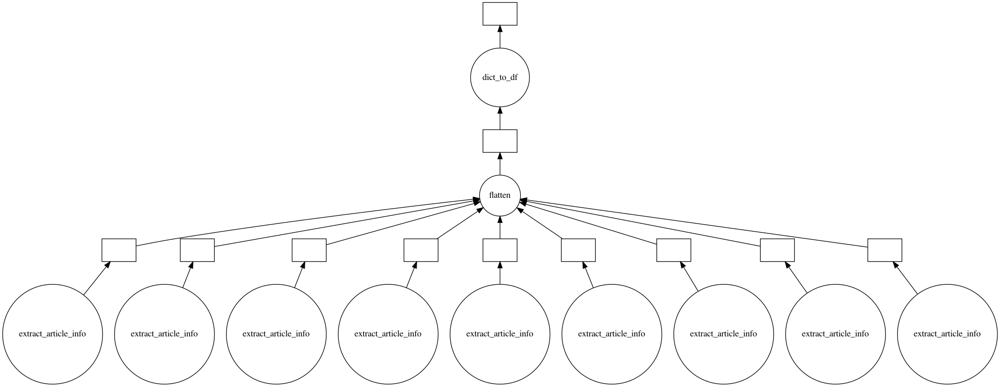

In [36]:
from dask.delayed import delayed
import dask
results = []

for link in combined_result_short:
    info = dask.delayed(extract_article_info)(link)
    results.append(info)

flatten_delayed = dask.delayed(flatten)(results)
delayed = dask.delayed(dict_to_df)(flatten_delayed)

delayed.visualize("dask2")

# Dask Implementation: All links

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0812452 to fit


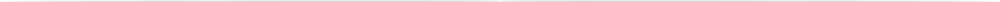

In [38]:
from dask.delayed import delayed
import dask
results = []

for link in combined_results:
    info = dask.delayed(extract_article_info)(link)
    results.append(info)

flatten_delayed = dask.delayed(flatten)(results)
delayed = dask.delayed(dict_to_df)(flatten_delayed)

delayed.visualize()

Getting a dataframe from the delayed implementation.

In [ ]:
df = delayed.compute()

There are cases where we see the Newspaper class does not extract information from the link correctly. We retry this one time. It is unable to extract features on ~500 links out ~1700. After retrying, this number falls to ~300.

In [61]:
unsuccessful_links = df[df['successfully_scraped'] == 0]['link'].to_list()
extracted_df = df[df['successfully_scraped'] == 1]

In [69]:
from dask.delayed import delayed
import dask
results = []

for link in unsuccessful_links:
    info = dask.delayed(extract_article_info)(link)
    results.append(info)

flatten_delayed = dask.delayed(flatten)(results)
delayed = dask.delayed(dict_to_df)(flatten_delayed)
retry_df = delayed.compute()

In [119]:
retry_df.successfully_scraped.value_counts()
regained_df = retry_df[retry_df['successfully_scraped'] == 1]

extracted_df = extracted_df.append(regained_df)

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


# Explaratory Analysis: Mapping

Here, we count the number of times a Pakistani city appears in each article. 

We use a csv containing names of Pakistani cities and then using that, count the number of instances these cities were mentioned in each article.

In [2]:
extracted_df = pd.read_csv("extracted_information.csv")

In [133]:
cities_df = pd.read_csv("pk.csv")
cities_df.head(1)

,city,lat,lng,country,iso2,admin_name,capital,population,population_proper
0,Karachi,24.86,67.01,Pakistan,PK,Sindh,admin,14835000.0,14835000.0


Forgive the naming convention that was used in this case.

In [147]:
test = extracted_df
city_list = []
for city in cities_df.city:
    city = city.lower()
    city_list.append(city)
    test[city] = extracted_df.text.str.lower().str.contains(city)
test = test[city_list]

In [148]:
test = test.reset_index()
df_melted = pd.melt(test, id_vars=test.columns[0], value_vars=city_list)

In [223]:
to_plot = df_melted.groupby(['variable'])['value'].agg('sum')
df_for_later = to_plot
to_plot = to_plot.sort_values(ascending=False).head(15)

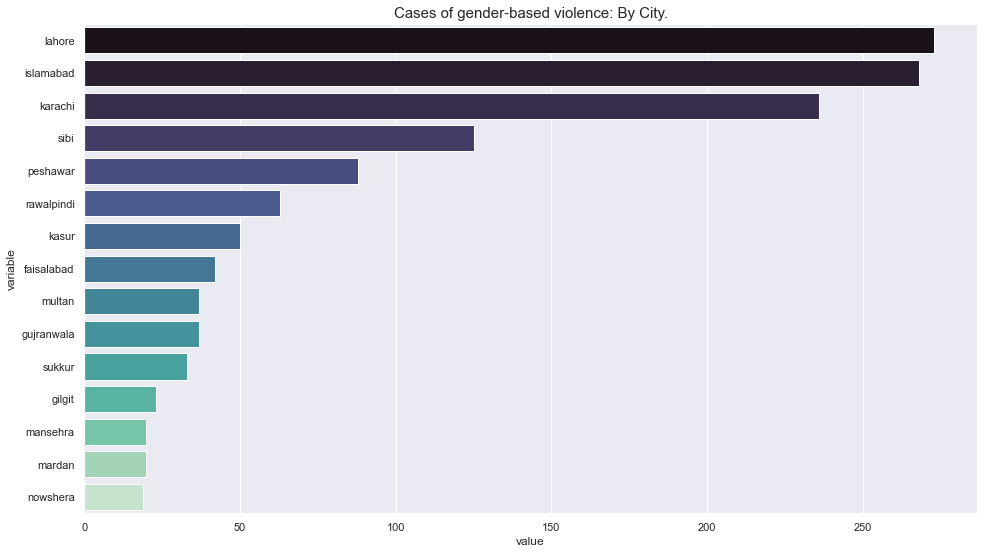

In [218]:
df = pd.DataFrame(to_plot)
sns.set()
y_vals = df.index.to_series()
x_vals = df['value']
plt.figure(figsize=(16,9))
sns.barplot(x=x_vals, y=y_vals, palette='mako')
plt.title('Cases of gender-based violence: By City.', size=15)
plt.savefig('plot1', dpi=300)
plt.show()

In [196]:
fiona.listlayers('/Users/rukhshan/Downloads/PAK_AdminBoundaries_candidate.gdb')
pak_gpd = gpd.read_file("/Users/rukhshan/Downloads/PAK_AdminBoundaries_candidate.gdb", driver='FileGDB', layer='pak_admbnda_adm2_ocha_pco_gaul_20181218')
pak_gpd.head(5)

,admin2Name_en,admin2Pcode,admin2RefName,admin2AltName1_en,admin2AltName2_en,admin1Name_en,admin1Pcode,admin0Name_en,admin0Pcode,date,validOn,validTo,Shape_Length,Shape_Area,geometry
0,Abbottabad,PK201,None,None,None,Khyber Pakhtunkhwa,PK2,Pakistan,PK,2018-11-30T00:00:00,2018-12-18T00:00:00,None,2.187495,0.171564,"MULTIPOLYGON (((73.46271 34.28738, 73.46965 34..."
1,Attock,PK601,None,None,None,Punjab,PK6,Pakistan,PK,2018-11-30T00:00:00,2018-12-18T00:00:00,None,4.739696,0.662449,"MULTIPOLYGON (((72.44029 34.00367, 72.44692 33..."
2,Awaran,PK701,None,None,None,Balochistan,PK7,Pakistan,PK,2018-11-30T00:00:00,2018-12-18T00:00:00,None,8.774626,2.252602,"MULTIPOLYGON (((65.90683 27.14291, 65.91685 27..."
3,Badin,PK801,None,None,None,Sindh,PK8,Pakistan,PK,2018-11-30T00:00:00,2018-12-18T00:00:00,None,4.516057,0.600593,"MULTIPOLYGON (((68.96827 25.29788, 68.97487 25..."
4,Bahawalnagar,PK602,None,None,None,Punjab,PK6,Pakistan,PK,2018-11-30T00:00:00,2018-12-18T00:00:00,None,7.041104,0.795837,"MULTIPOLYGON (((73.94623 30.30050, 73.94793 30..."


In [229]:
for_map = df_for_later.reset_index()
for_map.rename(columns={'variable': 'lower_city'}, inplace=True)

In [358]:
pak_gpd['lower_city'] = pak_gpd.admin2Name_en.str.lower()
mask = pak_gpd.lower_city == "karachi city"
column_name = 'lower_city'
pak_gpd.loc[mask, column_name] = "karachi"
df  = pak_gpd.merge(for_map, on='lower_city', how='inner')
df['value'] = df['value'].fillna(np.nan)
gdf = gpd.GeoDataFrame(df)

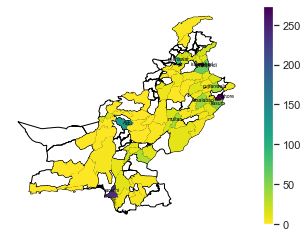

In [401]:
top_10_gdf = gdf.sort_values(by="value", ascending=False).head(10)

top_10_gdf['coords'] = top_10_gdf['geometry'].apply(lambda x: x.representative_point().coords[:])
top_10_gdf['coords'] = [coords[0] for coords in top_10_gdf['coords']]

base = pak_gpd.plot(color='none', edgecolor='black')

case_map = gdf.plot(ax=base, cmap='viridis_r',column='value', legend=True, edgecolor='none')
case_map.axis("off")
fig = case_map.get_figure()

for item in [fig, case_map]:
    item.patch.set_visible(False)
    
fig.savefig("map.jpeg", dpi=600)

for idx, row in top_10_gdf.iterrows():
    if row['lower_city'] == "lahore":
        color='black'
        align = 'left'
    else:
        color = 'black'
        align = 'center'
    plt.annotate(s=row['lower_city'], xy=row['coords'],
                 horizontalalignment=align, size=5, color=color)

fig.savefig("map_labelled.jpeg", dpi=600)

# Explaratory Analysis: WordCloud

Here, I utilize Python's wordcloud library. I recall the ```extracted_information.csv``` and create it into a delayed dataframe. I do this because we are utilizing text data and we would want our processes to be scalable. Arguably, using a delayed dataframe would not make sense here since the number of observations is lower. However, for scalability purposes we can utilize it.

In [5]:
extracted_df = pd.read_csv("extracted_information.csv")
extracted_df = dd.from_pandas(extracted_df, 4)

In [6]:
stop = set(stopwords.words("english"))
stop.add("the")

extracted_df['text'] = extracted_df['text'].fillna("")
extracted_df['text_dup'] = extracted_df['text'].str.lower()
extracted_df["text_dup"] = extracted_df['text_dup'].str.replace('[^\w\s]','')

extracted_df['tokenized_sents'] = extracted_df.apply(lambda row: nltk.word_tokenize(row['text_dup']), axis=1)
extracted_df['words'] = extracted_df['tokenized_sents'].apply(lambda x: [item for item in x if item not in stop])


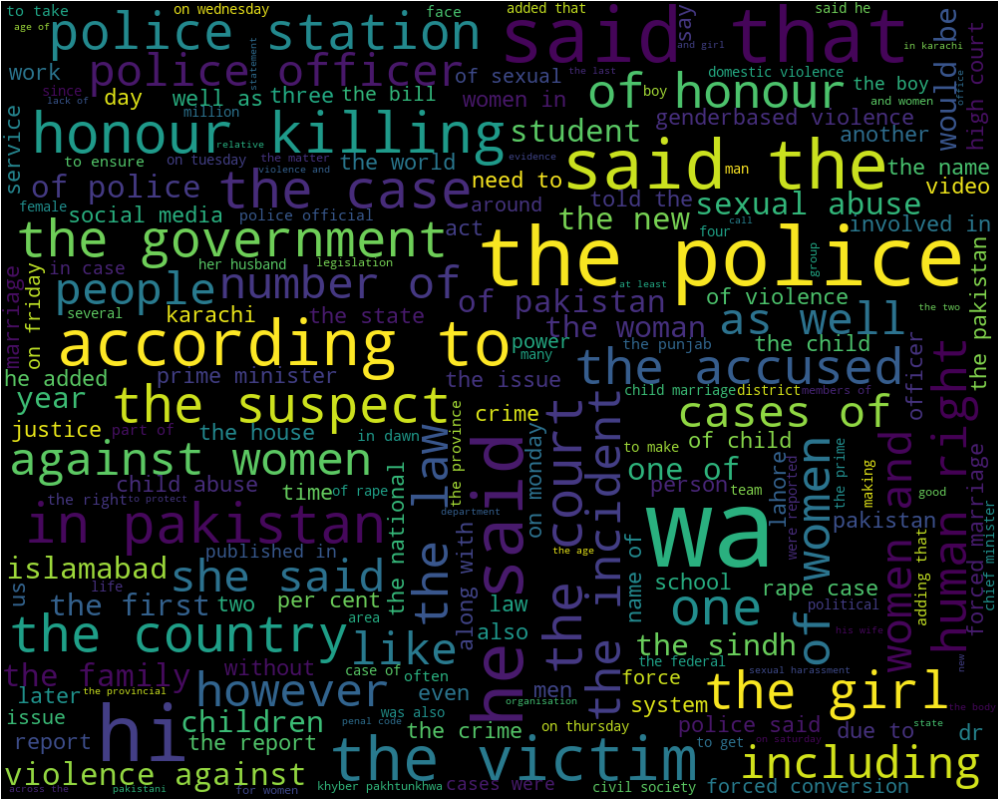

<Figure size 14400x7200 with 0 Axes>

In [512]:
plt.rcParams["figure.figsize"] = [200, 100]
allWords = ' '.join([twts for twts in extracted_df['text_dup']])
wordCloud = WordCloud(width=1000, height=800, random_state=21, max_font_size=110, stopwords=stop).generate(allWords)
plt.imshow(wordCloud, interpolation='bilinear')
plt.axis("off")
plt.figure()
plt.show()

In [546]:
extracted_df.compute().head(2)

,Unnamed: 0,link,datetime,title,text,authors,summary,keywords,images,has_top_image,top_image,is_valid_url,meta_lang,meta_data,media_links,successfully_scraped,text_dup,tokenized_sents,words
0,1,https://www.thenews.com.pk/latest/712364-india...,NaN,Indian actress Kondapalli Sravani allegedly co...,Indian actress Kondapalli Sravani allegedly co...,[],Indian actress Kondapalli Sravani allegedly co...,"['indian', 'residence', 'kondapalli', 'took', ...",{'https://www.thenews.com.pk/assets/front/imag...,True,https://www.thenews.com.pk/assets/uploads/upda...,True,en,"defaultdict(<class 'dict'>, {'viewport': 'widt...",[],1,indian actress kondapalli sravani allegedly co...,"[indian, actress, kondapalli, sravani, alleged...","[indian, actress, kondapalli, sravani, alleged..."
1,2,https://www.thenews.com.pk/print/626956-govern...,NaN,Governor takes notice of Chinese student’s all...,PESHAWAR: The alleged sexual harassment of a C...,['Yousaf Ali'],PESHAWAR: The alleged sexual harassment of a C...,"['inquiry', 'sources', 'foreign', 'takes', 'co...",{'https://www.thenews.com.pk/assets/front/imag...,True,https://www.thenews.com.pk/assets/front/img/no...,True,en,"defaultdict(<class 'dict'>, {'viewport': 'widt...",[],1,peshawar the alleged sexual harassment of a ch...,"[peshawar, the, alleged, sexual, harassment, o...","[peshawar, alleged, sexual, harassment, chines..."


### Visualizing Delayed Dataframe

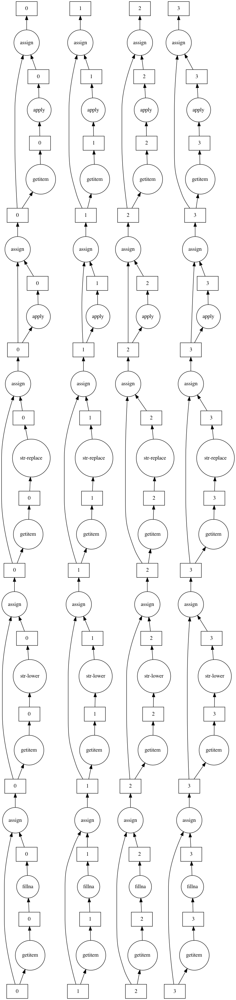

In [518]:
extracted_df.visualize("dask_wordcloud")

# Topic Modelling

Results are on the following webpage: https://lsc-project-ram.000webhostapp.com/#topic=0&lambda=1&term=

Sources:

- https://www.machinelearningplus.com/nlp/topic-modeling-python-sklearn-examples/
- https://towardsdatascience.com/evaluate-topic-model-in-python-latent-dirichlet-allocation-lda-7d57484bb5d0
- https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.LatentDirichletAllocation.html

In [10]:
#adding said to stopwords
stop.add("said")
count_vectorizer = CountVectorizer(max_features=10000,ngram_range=(1,3), stop_words=stop)
count_data = count_vectorizer.fit_transform(extracted_df['text_dup'])


In [12]:
# Helper function -- This helper function was taken from one of the sources mentioned above.
#Since I did not create this, I have added it in the Jupyter Notebook as opposed to my Python scripts
def print_topics(model, count_vectorizer, n_top_words):
    words = count_vectorizer.get_feature_names()
    for topic_idx, topic in enumerate(model.components_):
        print("\nTopic #%d:" % topic_idx)
        print(" ".join([words[i]
                        for i in topic.argsort()[:-n_top_words - 1:-1]]))
        
number_topics = 8

number_words = 10

# Create and fit the LDA model
lda = LDA(n_components=number_topics, n_jobs=-1)
lda.fit_transform(count_data)

# Print the topics found by the LDA model
print("Topics found via LDA:")
print_topics(lda, count_vectorizer, number_words)

Topics found via LDA:

Topic #0:
police officers officer also sindh would officials department chief general

Topic #1:
cases honour law rape killing reported killings pakistan years victims

Topic #2:
police killed family media boy women according punjab people death

Topic #3:
child children abuse sexual minister also sexual abuse child abuse government cases

Topic #4:
women violence rights pakistan also society gender genderbased genderbased violence girls

Topic #5:
one harassment people women would also time like years even

Topic #6:
forced marriage sindh pakistan government girls also religious bill rights

Topic #7:
police case accused court arrested girl two woman also suspect


For Hyperparameter tuning, I refer to the following article as guidance: https://towardsdatascience.com/evaluate-topic-model-in-python-latent-dirichlet-allocation-lda-7d57484bb5d0 For the purpose of this project, I do not utilize Hyperparameter evaluation. However, we can perform this task in parallel utilize Dask's HyperbandSearchCV module.

In [13]:
import pyLDAvis.sklearn
panel = pyLDAvis.sklearn.prepare(lda, count_data, count_vectorizer, mds='tsne')
pyLDAvis.save_html(panel, 'lda.html')

In [83]:
lda.get_params()

{'batch_size': 128,
 'doc_topic_prior': None,
 'evaluate_every': -1,
 'learning_decay': 0.7,
 'learning_method': 'batch',
 'learning_offset': 10.0,
 'max_doc_update_iter': 100,
 'max_iter': 10,
 'mean_change_tol': 0.001,
 'n_components': 8,
 'n_jobs': -1,
 'perp_tol': 0.1,
 'random_state': None,
 'topic_word_prior': None,
 'total_samples': 1000000.0,
 'verbose': 0}